In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
# Suppress all warning messages
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [2]:
## Conda Env pytorch-gpu on DCC
print(torch.__version__)
print(sc.__version__) 

1.13.0.post200
1.9.1


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load Data

In [4]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
dataset = Root_Dataset(data['X_test'], data['y_test'])
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [5]:
input_size = data['X_train'].shape[1]
## 10 cell types 
output_size = 10
embedding_dim = 256
hidden_dim = 256
n_layers = 2
device = "cpu"
path = "./"

## Load trained GeneSys model

In [6]:
model = ClassifierLSTM(input_size, output_size, embedding_dim, hidden_dim, n_layers).to(device)
model.load_state_dict(torch.load(path+"best_ALL_1130_continue.pth", map_location=torch.device('cpu')))
model = model
model.eval()

ClassifierLSTM(
  (fc1): Sequential(
    (0): Linear(in_features=17513, out_features=256, bias=True)
    (1): Dropout(p=0.2, inplace=False)
    (2): GaussianNoise()
  )
  (fc): Sequential(
    (0): ReLU()
    (1): Linear(in_features=512, out_features=512, bias=True)
    (2): ReLU()
    (3): Linear(in_features=512, out_features=10, bias=True)
  )
  (lstm): LSTM(256, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (b_to_z): DBlock(
    (fc1): Linear(in_features=512, out_features=256, bias=True)
    (fc2): Linear(in_features=512, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc_logsigma): Linear(in_features=256, out_features=512, bias=True)
  )
  (bz2_infer_z1): DBlock(
    (fc1): Linear(in_features=1024, out_features=256, bias=True)
    (fc2): Linear(in_features=1024, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc

In [7]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [8]:
cts = ['Atrichoblast','Trichoblast','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Lateral Root Cap','Columella']
ctw = np.zeros((len(cts), 17513, 17513))
## number of cells sampled from the atlas
batch_size = 2000

In [ ]:
## GRN for the transition t1 to t3
for ct in cts:
    print(ct)
    cws = np.zeros((len(loader), 17513, 17513))
    with torch.no_grad():
        for i, sample in enumerate(loader):
            x = sample['x'].to(device)
            y = sample['y'].to(device)
            y_label = [num2class[i] for i in y.tolist()]
            
            pred_h = model.init_hidden(batch_size)
            tfrom = model.generate_next(x, pred_h, 1).to('cpu').detach().numpy()
            cfrom = tfrom[np.where(np.array(y_label)==ct)[0],:]
            
            pred_h = model.init_hidden(batch_size)
            tto = model.generate_next(x, pred_h, 3).to('cpu').detach().numpy()   
            cto = tto[np.where(np.array(y_label)==ct)[0],:]
            
            cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()
            cws[i] = cw
    
    ## Calculate mean across number of repeats
    cwm = np.mean(cws, axis=0)
    ctw[cts.index(ct)] = cwm

In [ ]:
# Save the array to disk
np.save('genesys_ctw_t1-t3.npy', ctw)

In [9]:
ctw = np.load('genesys_ctw_t1-t3.npy')

In [10]:
## Calculate z-scores
ctw_z = np.zeros((len(cts), 17513, 17513))
for i in range(len(cts)):
    ctw_z[i] = (ctw[i] - np.mean(ctw[i])) / np.std(ctw[i])

In [11]:
## Filtering based on z-scores (with no weights)
ctw_f = np.zeros((len(cts), 17513, 17513))
## z-score threshold (keep values > mean + threshold*std)
threshold=3
for i in range(len(cts)):
    ctw_f[i] = np.abs(ctw_z[i]) > threshold

## Load TFs list

In [12]:
wanted_TFs = pd.read_csv("./Kay_TF_thalemine_annotations.csv")

In [13]:
## Make TF names unique and assign preferred names
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G33880"]="WOX9"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G45160"]="SCL27"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G04410"]="NAC78"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G29035"]="ORS1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02540"]="ZHD3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G16500"]="IAA26"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G09740"]="HAG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G24660"]="ZHD2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G46880"]="HDG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G28420"]="RLT1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G14580"]="BLJ"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G45260"]="BIB"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02070"]="RVN"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G28160"]="FIT"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G68360"]="GIS3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G20640"]="NLP4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G05550"]="VFP5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G59470"]="FRF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G15150"]="HAT7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G14750"]="WER"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G75710"]="BRON"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G74500"]="TMO7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G12646"]="RITF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G48100"]="ARR5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G16141"]="GATA17L"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G65640"]="NFL"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G62700"]="VND5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G36160"]="VND2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G66300"]="VND3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G12260"]="VND4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G62380"]="VND6"

In [14]:
pd.Series(wanted_TFs['Name']).value_counts().head(5)

NAC001    1
PRE5      1
MYB118    1
MYB21     1
MYB0      1
Name: Name, dtype: int64

## Network analysis

In [15]:
TFidx = []
for i in wanted_TFs['GeneID']:
    if i in gene_list['features'].tolist():
        TFidx.append(np.where(gene_list['features']==i)[0][0])

TFidx = np.sort(np.array(TFidx))

In [23]:
def network(i):
    ## No weights
    adj_nw = ctw_f[i]
    ## Weighted
    adj = ctw[i]*ctw_f[i]
    ## TF only
    adj = adj[np.ix_(TFidx,TFidx)]
    adj_nw = adj_nw[np.ix_(TFidx,TFidx)]
    
    ## Remove no connect 
    regidx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[0]).value_counts().index[pd.Series(np.where(adj_nw==True)[0]).value_counts()>=1]))
    taridx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[1]).value_counts().index[pd.Series(np.where(adj_nw==True)[1]).value_counts()>=1]))
    ## Reciprocol
    keepidx = np.sort(np.array(list(set(regidx).intersection(taridx))))
    #keepidx = np.sort(np.array(list(set(regidx).union(taridx))))
    
    TFID = np.array(gene_list['features'][TFidx])[keepidx].tolist()
    ## TF name to keep
    TFname = []
    for i in np.array(gene_list['features'][TFidx])[keepidx]:
        TFname.append(wanted_TFs['Name'][np.where(wanted_TFs['GeneID']==i)[0][0]])
        
    adj = adj[np.ix_(keepidx,keepidx)]
    
    # Create a NetworkX graph for non-directed edges
    G = nx.Graph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(i, j, weight=abs(weight), distance=1/abs(weight))
            

    ## Measures the extent to which how close a node is to all other nodes in the network, considering the shortest paths or geodesic distances between nodes
    closeness_centrality = nx.closeness_centrality(G, distance='distance')
    ## Measures the extent to which a node that are not only well-connected but also connected to other well-connected nodes.
    eigenvector_centrality = nx.eigenvector_centrality(G)
    
    # Create a NetworkX graph for diected edges
    G = nx.MultiDiGraph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(i, j, weight=weight)
    
    ## Measures the number of connections (edges) each node has
    degree_centrality = nx.degree_centrality(G)
    # Calculate outgoing centrality
    out_centrality = nx.out_degree_centrality(G)
    # Calculate incoming centrality
    in_centrality = nx.in_degree_centrality(G)
    ## Measures the extent to which a node lies on the shortest paths between other nodes.
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    
    ## Non_Reciprocal Out centrality
    # Visualize the graph
    pos = nx.spring_layout(G)  # Positions of the nodes
    
    # Node colors based on weighted betweenness centrality
    node_colors = [out_centrality[node] for node in G.nodes()]
    
    # Node sizes based on weighted betweenness centrality
    node_sizes = [out_centrality[node] * 1000 for node in G.nodes()]

    # Get the edge weights as a dictionary
    edge_weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['red' if weight > 0 else 'blue' for (_, _, weight) in G.edges(data='weight')]
    
    # Scale the edge weights to desired linewidths
    max_weight = max(edge_weights.values())
    edge_widths = [float(edge_weights[edge]) / max_weight for edge in G.edges]
    
    # Draw the graph
    nx.draw(G, pos=pos, node_color=node_colors, node_size=node_sizes, with_labels=False, width=edge_widths, edge_color=edge_colors)
    # Add node labels
    labels = {node: G.nodes[node]['name'] for node in G.nodes}
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=8)
    
    # Add a colorbar to show the weighted betweenness centrality color mapping
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    plt.colorbar(sm)
    
    # Show the plot
    plt.show()
    
    dc = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['degree_centrality'])
    oc = pd.DataFrame.from_dict(out_centrality, orient='index', columns=['out_centrality'])
    ic = pd.DataFrame.from_dict(in_centrality, orient='index', columns=['in_centrality'])
    bc = pd.DataFrame.from_dict(betweenness_centrality, orient='index', columns=['betweenness_centrality'])
    cc = pd.DataFrame.from_dict(closeness_centrality, orient='index', columns=['closeness_centrality'])
    ec = pd.DataFrame.from_dict(eigenvector_centrality, orient='index', columns=['eigenvector_centrality'])
    df = pd.concat([dc,oc,ic,bc,cc,ec], axis=1)
    df.index =TFname
    df = df.sort_values('betweenness_centrality', ascending=False)
    
    return(df)

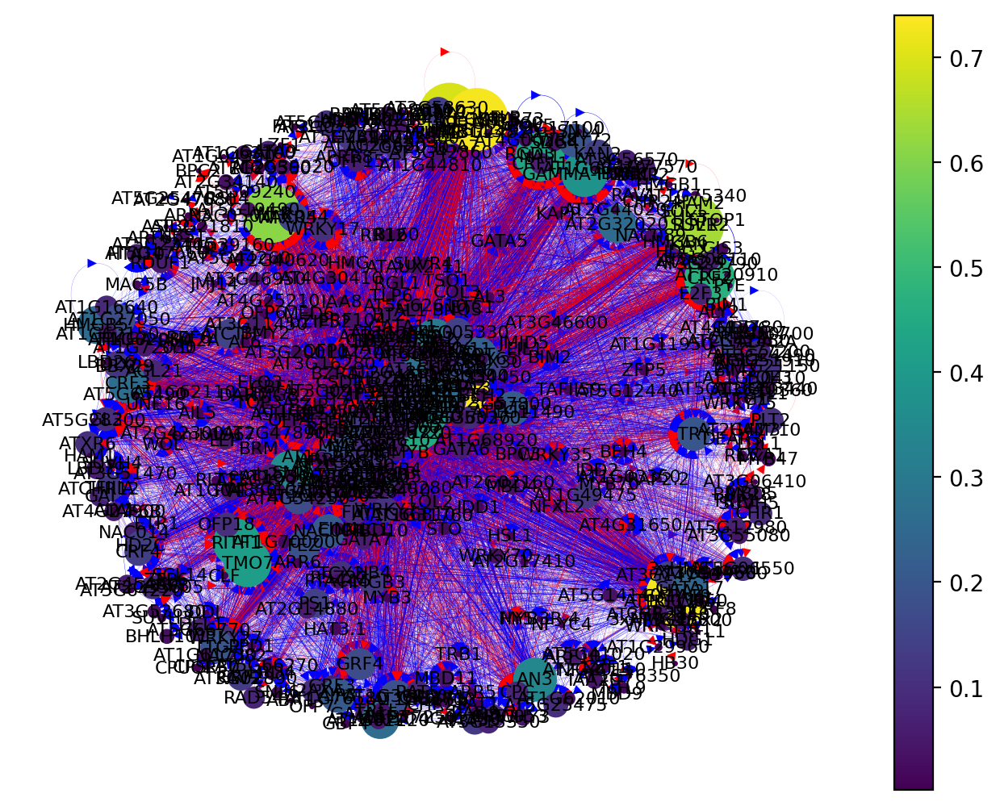

In [24]:
atri = network(0)

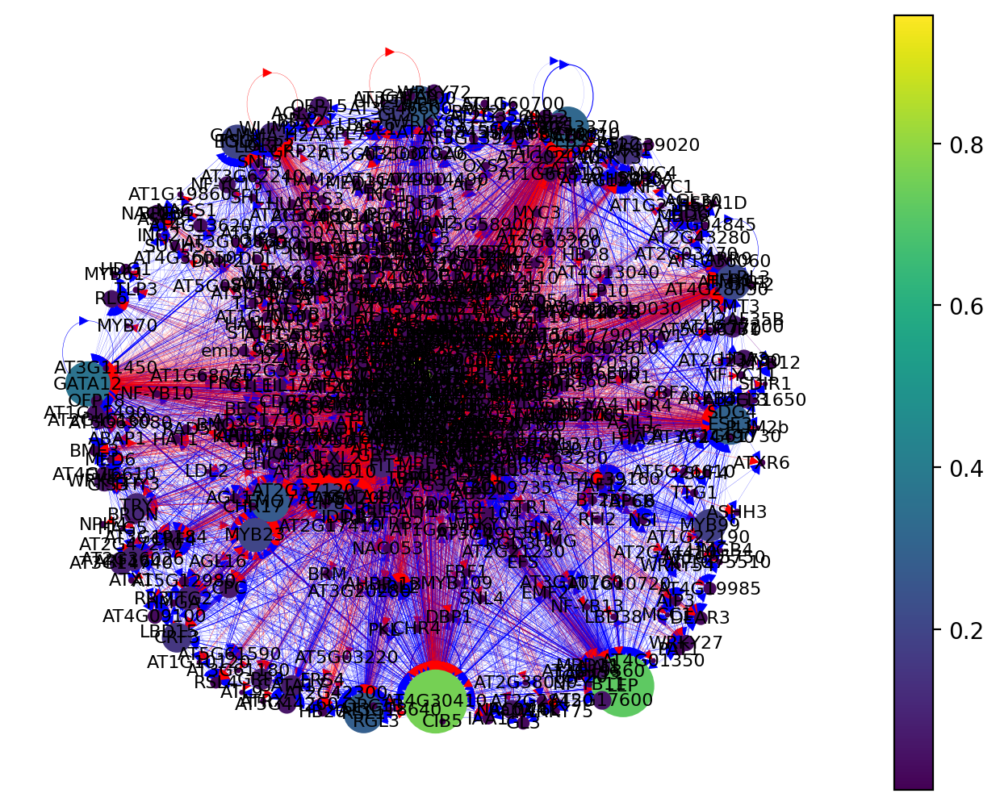

In [25]:
tri = network(1)

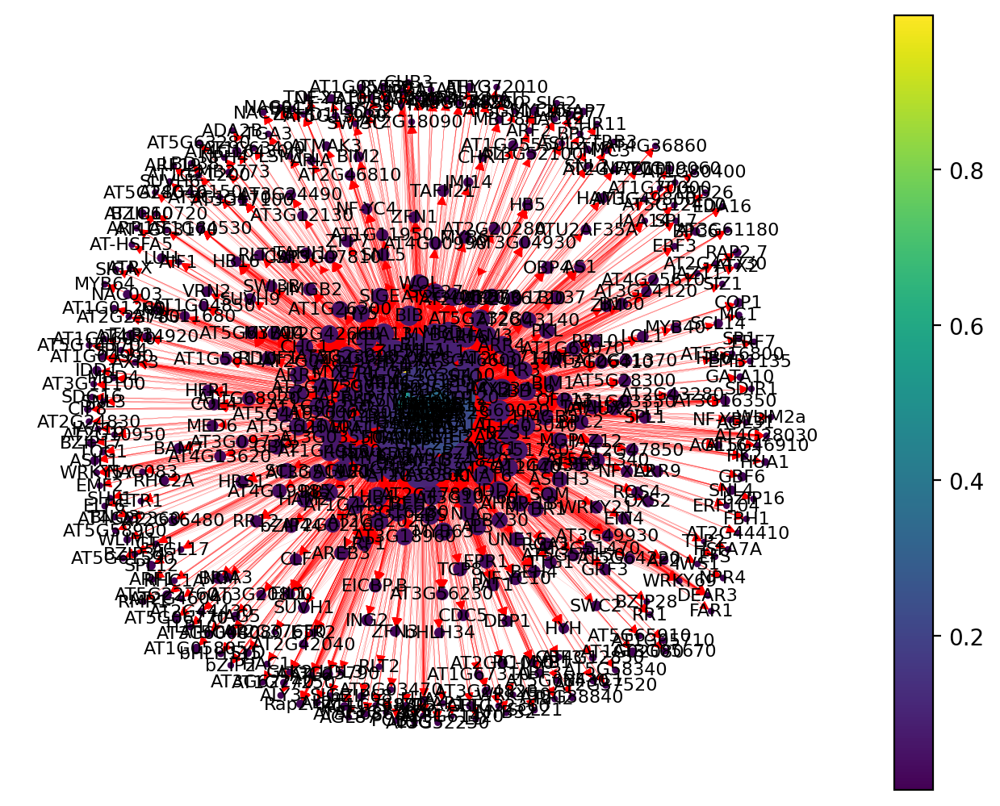

In [26]:
cor = network(2)

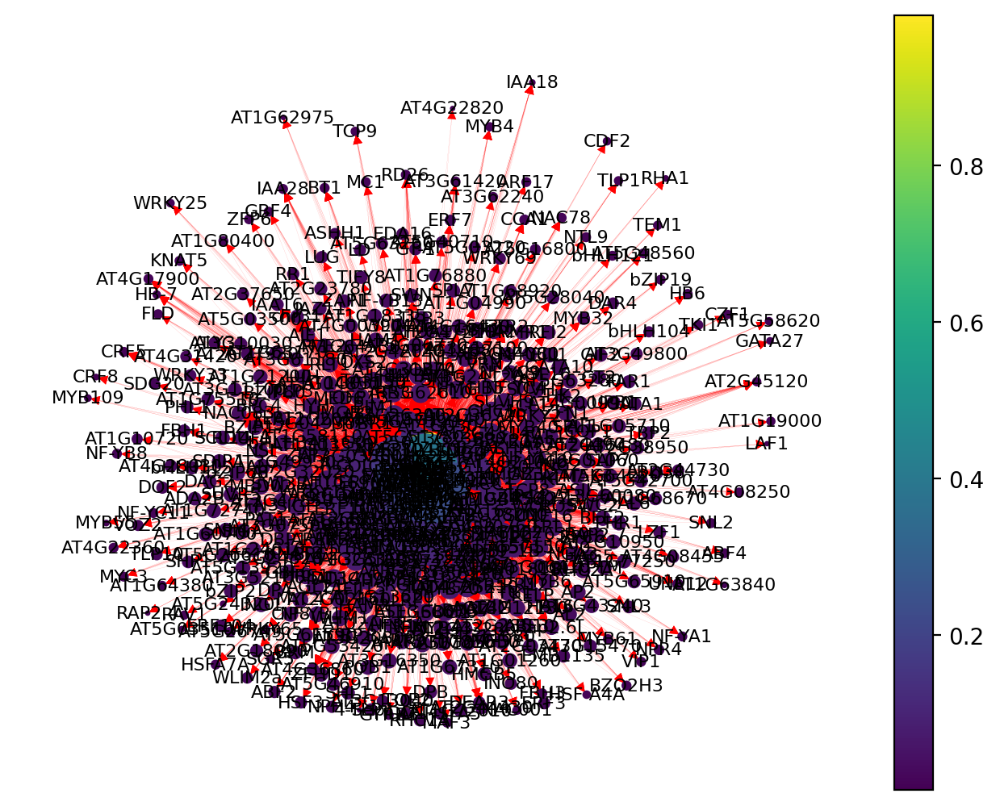

In [27]:
end = network(3)

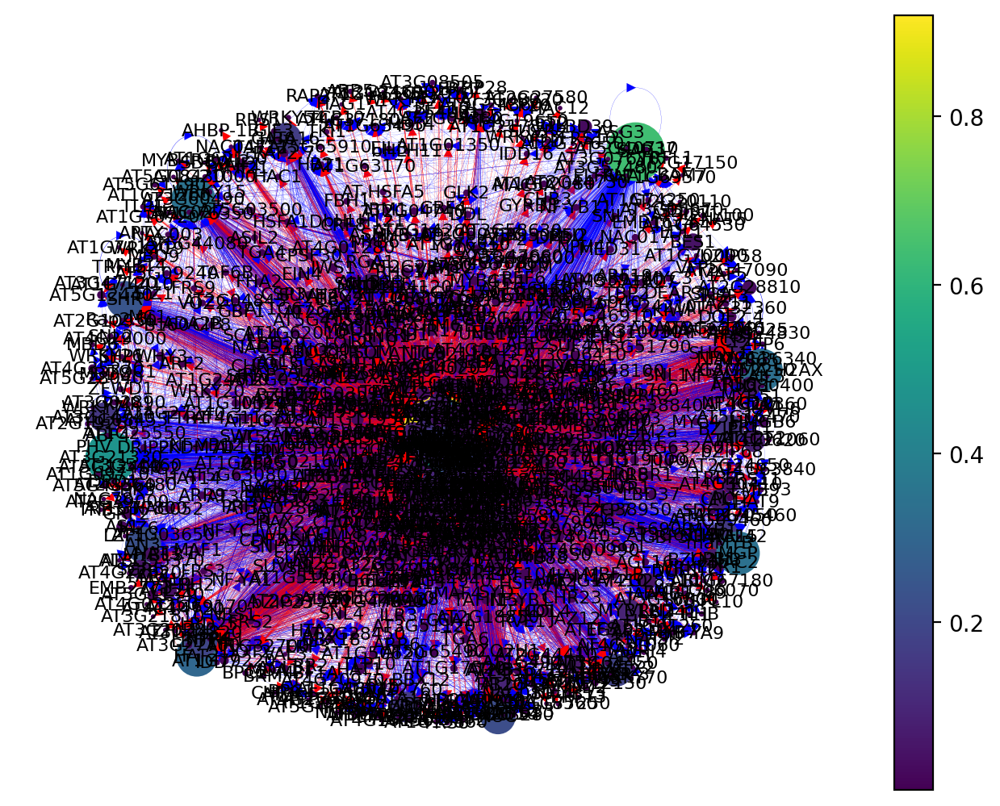

In [28]:
per = network(4)

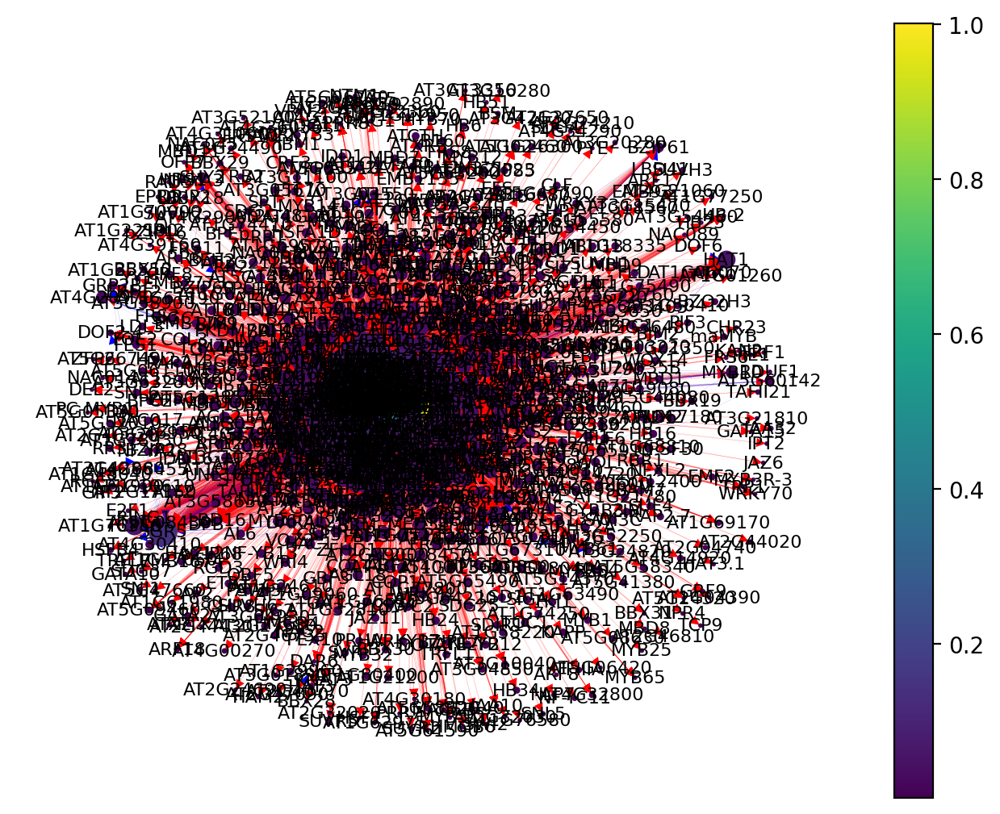

In [29]:
pro = network(5)

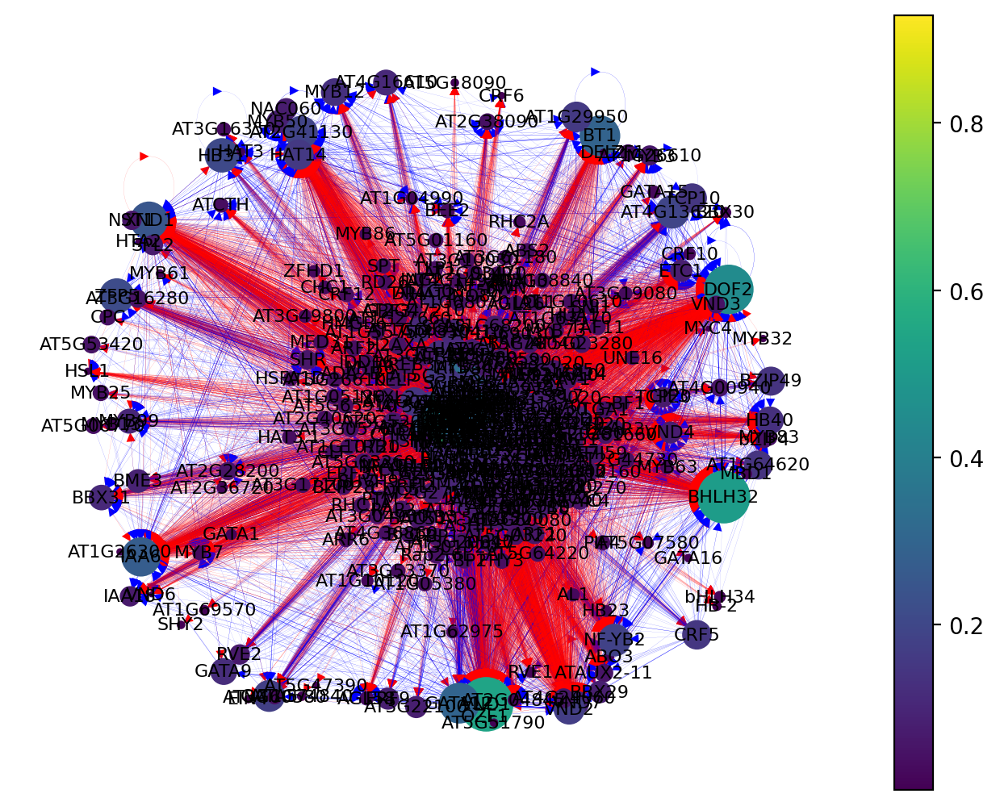

In [30]:
xyl = network(6)

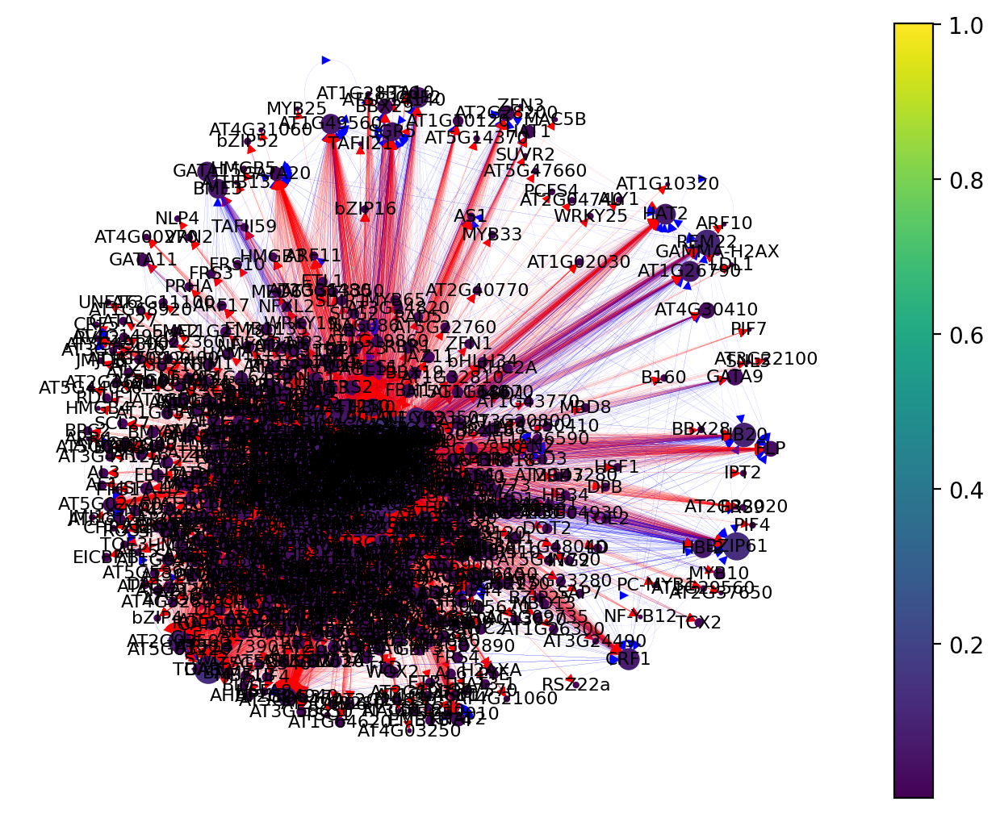

In [31]:
phl = network(7)

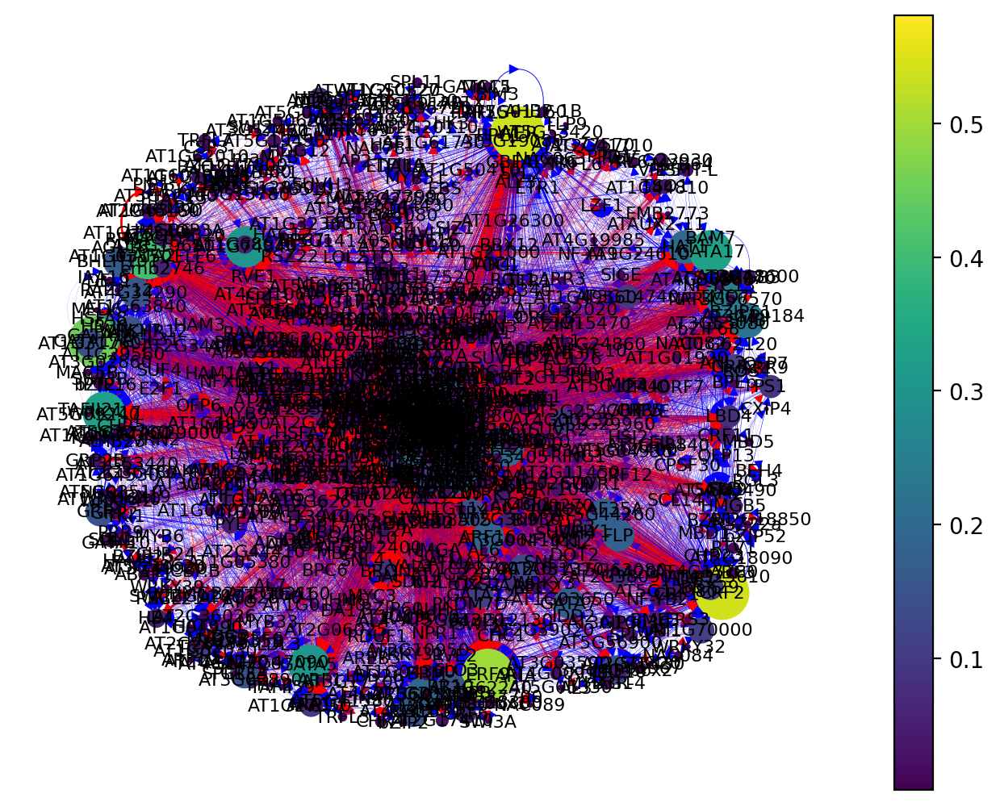

In [32]:
lrc = network(8)

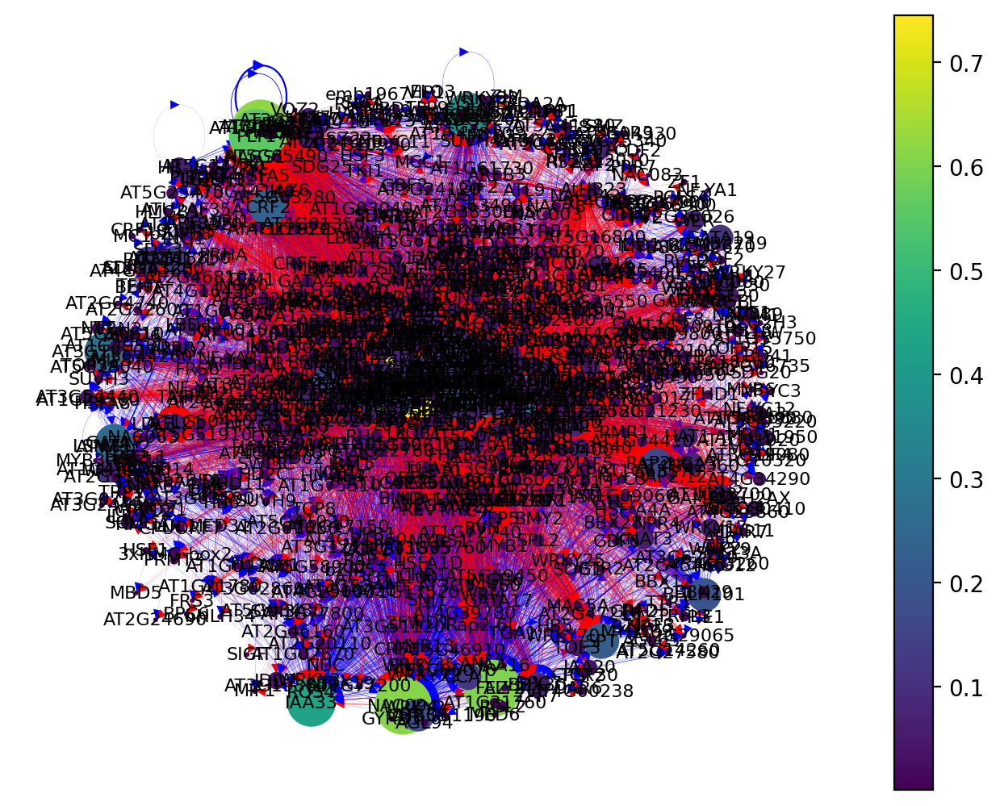

In [33]:
col = network(9)

In [34]:
atri.columns = ['atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality']
tri.columns = ['tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality']
cor.columns = ['cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality']
end.columns = ['end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality']
per.columns = ['per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality']
pro.columns = ['pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality']
xyl.columns = ['xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality']
phl.columns = ['phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality']
lrc.columns = ['lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality']
col.columns = ['col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality']

In [35]:
## Indentify main regulators in each net work
tff = []
tff = tff + atri[atri['atri_betweenness_centrality']>0].index.tolist()
tff = tff + tri[tri['tri_betweenness_centrality']>0].index.tolist()
tff = tff + lrc[lrc['lrc_betweenness_centrality']>0].index.tolist()
tff = tff + cor[cor['cor_betweenness_centrality']>0].index.tolist()
tff = tff + end[end['end_betweenness_centrality']>0].index.tolist()
tff = tff + per[per['per_betweenness_centrality']>0].index.tolist()
tff = tff + pro[pro['pro_betweenness_centrality']>0].index.tolist()
tff = tff + xyl[xyl['xyl_betweenness_centrality']>0].index.tolist()
tff = tff + phl[phl['phl_betweenness_centrality']>0].index.tolist()
tff = tff + col[col['col_betweenness_centrality']>0].index.tolist()
tf_occurance = pd.DataFrame(pd.Series(tff).value_counts(), columns=['tf_occurance'])
tf_spec = pd.concat([tf_occurance, atri, tri, lrc, cor, end, per, pro, xyl, phl, col], axis=1)
tf_spec = tf_spec.fillna(0)

In [36]:
## Epidermis (atri, tri, lrc)
celltype1='atri'
celltype2='tri'
celltype3='lrc'
ts = tf_spec[tf_spec['tf_occurance']==3][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==9].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,lrc_betweenness_centrality,atri_out_centrality,tri_out_centrality,lrc_out_centrality,atri_in_centrality,tri_in_centrality,lrc_in_centrality,centrality_count,centrality_sum
ATS,0.911741,0.802023,0.768044,0.091463,0.184991,0.119537,0.585366,0.659686,0.470437,9,13.593288
GL2,0.940337,0.581637,0.794062,0.095528,0.179756,0.255784,0.510163,0.073298,0.105398,9,12.535963
WRKY9,0.263193,0.154999,0.983636,0.193089,0.467714,0.223650,0.497967,0.256545,0.425450,9,12.466244
TTG2,0.905573,0.391550,0.014513,0.193089,0.094241,0.127249,0.422764,0.055846,0.068123,9,11.272949
GATA17,0.817301,0.000162,0.316965,0.237805,0.073298,0.332905,0.223577,0.017452,0.132391,9,11.151855
TRY,0.727121,0.008339,0.371758,0.199187,0.109948,0.136247,0.290650,0.020942,0.023136,9,10.887328
FIT,0.811816,0.000531,0.087486,0.099593,0.097731,0.119537,0.422764,0.118674,0.118252,9,10.876385
CRF4,0.705881,0.068896,0.013112,0.134146,0.059337,0.124679,0.315041,0.080279,0.086118,9,10.587488
WRKY72,0.330754,0.293429,0.188152,0.197154,0.040140,0.053985,0.034553,0.078534,0.071979,9,10.288680
OFP18,0.674254,0.000802,0.000374,0.101626,0.017452,0.033419,0.223577,0.015707,0.006427,9,10.073639


In [37]:
## atri, tri
celltype1='atri'
celltype2='tri'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,atri_out_centrality,tri_out_centrality,atri_in_centrality,tri_in_centrality,centrality_count,centrality_sum
AT3G53370,0.879734,0.918494,0.085366,0.321117,0.060976,0.820244,6,9.085931
ATMYC1,0.509273,0.747507,0.695122,0.218150,0.028455,0.549738,6,8.748245
RSL1,0.178295,0.487674,0.640244,0.287958,0.012195,0.179756,6,7.786121
IAA14,0.886464,0.000366,0.158537,0.151832,0.207317,0.308901,6,7.713417
EGL3,0.064229,0.406183,0.729675,0.202443,0.022358,0.157068,6,7.581956
RHD6,0.262365,0.557668,0.205285,0.139616,0.020325,0.350785,6,7.536044
WRI1,0.754682,0.001751,0.260163,0.146597,0.164634,0.010471,6,7.338298


In [38]:
## Atrichoblast specific
celltype = 'atri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,atri_betweenness_centrality,atri_out_centrality,atri_in_centrality,centrality_count,centrality_sum
AT1G27050,0.006512,0.174797,0.046748,3,3.228056
NAC044,0.000886,0.152439,0.020325,3,3.173650
KAN2,0.000604,0.140244,0.004065,3,3.144913


In [39]:
## Trichoblast specific
celltype = 'tri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,tri_betweenness_centrality,tri_out_centrality,tri_in_centrality,centrality_count,centrality_sum
WRKY75,0.946683,0.006981,0.083770,3,4.037433
AT4G09100,0.846737,0.031414,0.043630,3,3.921780
MED6,0.401918,0.005236,0.090750,3,3.497904
RSL4,0.186181,0.017452,0.115183,3,3.318816
PRMT3,0.055062,0.001745,0.001745,3,3.058553
LRL3,0.038312,0.001745,0.031414,3,3.071471
AT1G02040,0.016997,0.029668,0.043630,3,3.090296
AT4G39160,0.008973,0.024433,0.116928,3,3.150334
MYB47,0.004546,0.097731,0.041885,3,3.144162
WRKY61,0.001303,0.008726,0.008726,3,3.018755


In [40]:
## LRC specific
celltype = 'lrc'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,lrc_betweenness_centrality,lrc_out_centrality,lrc_in_centrality,centrality_count,centrality_sum
GRF2,0.492789,0.109254,0.084833,3,3.686877
MIF3,0.356946,0.024422,0.037275,3,3.418643
AT5G16680,0.298771,0.007712,0.014139,3,3.320622
AGL94,0.152410,0.029563,0.055270,3,3.237243
CZF1,0.138546,0.029563,0.116967,3,3.285076
CRF8,0.132505,0.030848,0.055270,3,3.218623
HDG2,0.106891,0.098972,0.035990,3,3.241852
AT4G39780,0.104858,0.021851,0.025707,3,3.152415
OFP6,0.094998,0.008997,0.146530,3,3.250525
TCX2,0.083117,0.106684,0.055270,3,3.245071


In [41]:
## Columella specific
celltype = 'col'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,col_betweenness_centrality,col_out_centrality,col_in_centrality,centrality_count,centrality_sum
KNAT3,0.366312,0.063197,0.061958,3,3.491467
FBH4,0.338893,0.016109,0.254027,3,3.609029
WRKY33,0.233397,0.078067,0.104089,3,3.415553
NTT,0.004625,0.022305,0.021066,3,3.047995
AT5G41020,0.002829,0.040892,0.037175,3,3.080896
AT5G06110,0.001770,0.058240,0.057001,3,3.117011
RAP2.1,0.001268,0.008674,0.019827,3,3.029769
CHR4,0.001248,0.076828,0.063197,3,3.141273
MYB73,0.001239,0.003717,0.047088,3,3.052045
ARF8,0.001238,0.014870,0.052045,3,3.068152


In [42]:
## Ground tissue
celltype1='cor'
celltype2='end'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,cor_betweenness_centrality,end_betweenness_centrality,cor_out_centrality,end_out_centrality,cor_in_centrality,end_in_centrality,centrality_count,centrality_sum
ARR3,0.013035,0.030588,0.336049,0.306773,0.490835,0.864542,6,8.041822
MYB36,0.056428,0.013912,0.360489,0.400398,0.048880,1.001992,6,7.882099
MYB3,0.009053,0.020278,0.378819,0.372510,0.095723,0.992032,6,7.868414
JKD,0.015333,0.014429,0.354379,0.348606,0.596741,0.444223,6,7.773711
MYB68,0.000233,0.012409,0.252546,0.308765,0.024440,0.974104,6,7.572496
...,...,...,...,...,...,...,...,...
AT4G25610,0.000254,0.000004,0.014257,0.041833,0.010183,0.009960,6,6.076490
RLT1,0.000154,0.000159,0.016293,0.035857,0.010183,0.005976,6,6.068622
AT3G12130,0.000017,0.000231,0.014257,0.041833,0.002037,0.003984,6,6.062357
AT3G61420,0.000175,0.000080,0.002037,0.011952,0.008147,0.031873,6,6.054262


In [43]:
## Cortex specific
celltype = 'cor'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,cor_betweenness_centrality,cor_out_centrality,cor_in_centrality,centrality_count,centrality_sum
SIGF,0.010765,0.004073,0.010183,3,3.025022
WRKY57,0.004181,0.004073,0.069246,3,3.077501
HAM2,0.002789,0.036660,0.054990,3,3.094439
MYB14,0.002523,0.026477,0.134420,3,3.163419
AT2G42660,0.002415,0.048880,0.232179,3,3.283474
EIL1,0.002365,0.016293,0.109980,3,3.128638
TAFII59,0.002107,0.030550,0.006110,3,3.038767
HMGB2,0.001866,0.024440,0.024440,3,3.050746
HB16,0.001833,0.014257,0.091650,3,3.107739
RR2,0.001397,0.002037,0.006110,3,3.009543


In [44]:
## Endodermis specific
celltype = 'end'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,end_betweenness_centrality,end_out_centrality,end_in_centrality,centrality_count,centrality_sum
chr31,0.026851,0.025896,0.225100,3,3.277847
AT2G27930,0.010986,0.023904,0.107570,3,3.142460
NAC083,0.009085,0.031873,0.179283,3,3.220241
AT2G45120,0.008867,0.009960,0.061753,3,3.080580
IAA16,0.007960,0.021912,0.085657,3,3.115530
...,...,...,...,...,...
AT5G26749,0.000004,0.013944,0.007968,3,3.021916
SPL7,0.000004,0.025896,0.007968,3,3.033869
CIP8,0.000004,0.033865,0.009960,3,3.043829
NF-YA1,0.000004,0.011952,0.003984,3,3.015940


In [45]:
## Stele
celltype1='per'
celltype2='pro'
celltype3='xyl'
celltype4='phl'
ts = tf_spec[tf_spec['tf_occurance']==4][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype4+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype4+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality', celltype4+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==12].sort_values(['centrality_count','centrality_sum'], ascending=False)

,per_betweenness_centrality,pro_betweenness_centrality,xyl_betweenness_centrality,phl_betweenness_centrality,per_out_centrality,pro_out_centrality,xyl_out_centrality,phl_out_centrality,per_in_centrality,pro_in_centrality,xyl_in_centrality,phl_in_centrality,centrality_count,centrality_sum
AT3G43430,0.148291,0.322640,0.075969,0.056666,0.521499,0.415318,0.246032,0.515436,0.797133,0.996764,0.219577,0.860403,12,17.175729
HB-8,0.536432,0.109958,0.712503,0.021305,0.044101,0.190939,0.500000,0.629530,0.027563,0.519957,0.944444,0.014765,12,16.251499
MYB20,0.100236,0.053263,0.001600,0.030719,0.489526,0.606257,0.137566,0.633557,0.414553,0.838188,0.417989,0.025503,12,15.748958
MYB43,0.182036,0.004801,0.000372,0.041344,0.272326,0.507012,0.116402,0.657718,0.243660,0.549083,0.023810,0.034899,12,14.633464
AT1G61660,0.111503,0.010047,0.000379,0.028837,0.004410,0.388350,0.050265,0.422819,0.197354,0.817691,0.126984,0.108725,12,14.267364
AT1G12440,0.001649,0.205924,0.315173,0.001460,0.060639,0.426106,0.261905,0.259060,0.027563,0.139159,0.124339,0.063087,12,13.886064
TCP14,0.002147,0.000037,0.002028,0.162237,0.033076,0.132686,0.370370,0.398658,0.016538,0.333333,0.206349,0.175839,12,13.833299


In [46]:
## Pericycle
celltype = 'per'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,per_betweenness_centrality,per_out_centrality,per_in_centrality,centrality_count,centrality_sum
LBD14,0.626412,0.192944,0.170893,3,3.990249
AT3G21330,0.354888,0.477398,0.058434,3,3.890720
SAP,0.253036,0.636163,0.020948,3,3.910147
AT1G27660,0.062708,0.153252,0.146637,3,3.362598
GATA23,0.042362,0.119074,0.062845,3,3.224281
AT3G60580,0.040281,0.130099,0.037486,3,3.207867
ATWHY2,0.035955,0.051819,0.094818,3,3.182593
NAC001,0.033811,0.060639,0.151047,3,3.245498
bZIP5,0.031200,0.101433,0.183021,3,3.315654
WHY1,0.018266,0.132304,0.008820,3,3.159391


In [47]:
## Procambium
celltype = 'pro'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,pro_betweenness_centrality,pro_out_centrality,pro_in_centrality,centrality_count,centrality_sum
AT5G60142,0.251327,0.011866,0.003236,3,3.266430
AT4G20970,0.053128,0.021575,0.001079,3,3.075782
HAT3,0.029663,0.004315,0.042071,3,3.076049
SHY2,0.016662,0.011866,0.074434,3,3.102962
AT1G32810,0.000185,0.007551,0.002157,3,3.009894
ABF4,0.000104,0.011866,0.009709,3,3.021679
MAF1,0.000087,0.038835,0.009709,3,3.048631
AT-HSFA5,0.000059,0.022654,0.002157,3,3.024871
AT1G10720,0.000040,0.024811,0.010787,3,3.035638
SNL1,0.000037,0.017260,0.009709,3,3.027006


In [48]:
## Xylem
celltype = 'xyl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,xyl_betweenness_centrality,xyl_out_centrality,xyl_in_centrality,centrality_count,centrality_sum
AT1G68810,0.932915,0.558201,0.960317,3,5.451434
VND2,0.889296,0.169312,0.912698,3,4.971306
HB31,0.888622,0.206349,0.087302,3,4.182273
MYB46,0.784255,0.333333,0.462963,3,4.580551
VND7,0.781714,0.095238,0.576720,3,4.453672
XND1,0.671852,0.251323,0.867725,3,4.790900
HAT14,0.628465,0.156085,0.857143,3,4.641692
ETC1,0.616276,0.079365,0.576720,3,4.272360
AGL58,0.572243,0.029101,0.177249,3,3.778592
IAA6,0.571646,0.272487,0.857143,3,4.701276


In [49]:
## Phloem
celltype = 'phl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,phl_betweenness_centrality,phl_out_centrality,phl_in_centrality,centrality_count,centrality_sum
DAR2,0.757107,0.132886,0.855034,3,4.745026
NAC020,0.707076,0.048322,0.535570,3,4.290968
HCA2,0.668388,0.055034,0.657718,3,4.381139
AT2G03500,0.667116,0.079195,0.895302,3,4.641613
REM22,0.576102,0.110067,0.120805,3,3.806975
GATA20,0.502163,0.028188,0.280537,3,3.810888
NAC057,0.064336,0.102013,0.732886,3,3.899235
AT3G12730,0.036159,0.083221,0.906040,3,4.025420
AT1G26790,0.006888,0.069799,0.083221,3,3.159908
BRH1,0.001967,0.068456,0.139597,3,3.210020


## Search for individual genes

In [50]:
gene = 'SHR'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality,per_degree_centrality,per_out_centrality,per_in_centrality,...,pro_out_centrality,pro_in_centrality,pro_closeness_centrality,pro_eigenvector_centrality,xyl_degree_centrality,xyl_out_centrality,xyl_in_centrality,xyl_betweenness_centrality,xyl_closeness_centrality,xyl_eigenvector_centrality
SHR,3.0,0.179283,0.151394,0.027888,0.000879,0.000501,0.056736,0.367144,0.24366,0.123484,...,0.100324,0.021575,0.000384,0.046686,0.174603,0.058201,0.116402,0.04416,0.000484,0.04425


In [51]:
gene = 'BLJ'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
BLJ,2.0,0.130346,0.095723,0.034623,0.000021,0.000296,0.055857,0.920319,0.135458,0.784861,0.01771,0.000491,0.127557


In [52]:
gene = 'JKD'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_closeness_centrality,col_eigenvector_centrality
JKD,2.0,0.95112,0.354379,0.596741,0.015333,0.000348,0.143791,0.792829,0.348606,0.444223,0.014429,0.000572,0.110048,0.034696,0.016109,0.018587,0.00029,0.019235


In [53]:
gene = 'RVN'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_closeness_centrality,col_eigenvector_centrality
RVN,2.0,0.181263,0.11609,0.065173,0.000004,0.000305,0.068971,0.272908,0.189243,0.083665,0.000095,0.000523,0.07088,0.006196,0.004957,0.001239,0.000201,0.005268


In [54]:
gene = 'BIB'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
BIB,2.0,0.071283,0.065173,0.00611,0.000012,0.000276,0.040438,0.436255,0.099602,0.336653,0.002239,0.000459,0.089354


In [55]:
gene = 'IME'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [56]:
gene = 'MYB66'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [57]:
gene = 'GL2'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,tri_in_centrality,tri_betweenness_centrality,tri_closeness_centrality,tri_eigenvector_centrality,lrc_degree_centrality,lrc_out_centrality,lrc_in_centrality,lrc_betweenness_centrality,lrc_closeness_centrality,lrc_eigenvector_centrality
GL2,3.0,0.605691,0.095528,0.510163,0.940337,0.001224,0.109614,0.253054,0.179756,0.073298,0.581637,0.000692,0.083733,0.361183,0.255784,0.105398,0.794062,0.000822,0.086665


In [58]:
tf_spec.to_csv('TF_GRN_centrality_t1-t3_zscore3.csv', index=True)